In [16]:
import torch
import numpy as np
import os

In [17]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

In [18]:
def get_NPFs(outlists):
    prev = None
    for cur_w in outlists:
        if(prev is None):
            prev = torch.transpose(cur_w,0,1)
        else:
            cur_w = torch.transpose(cur_w,0,1)
            tmp=[]
            for i in range(prev.size()[0]):
                t1 = torch.unsqueeze(prev[i],0)
                rtmp = torch.transpose(t1*cur_w,0,1)
                tmp.append(rtmp)
                
            prev = torch.transpose(torch.concat(tmp,dim=1),0,1)
    
    return prev

In [19]:
# def get_NPFs(outlists):
#     outlists.reverse()
#     prev = None
#     for cur_w in outlists:
#         if(prev is None):
#             prev = torch.transpose(cur_w,0,1)
#         else:
#             cur_w = torch.transpose(cur_w,0,1)
#             tmp=[]
#             for i in range(prev.size()[0]):
#                 t1 = torch.unsqueeze(prev[i],0)
#                 rtmp = torch.transpose(t1*cur_w,0,1)
#                 tmp.append(rtmp)
                
#             prev = torch.transpose(torch.concat(tmp,dim=1),0,1)
    
#     return prev

In [20]:
ll = [torch.Tensor([[1,-1]]),torch.Tensor([[1,-1,2]]),torch.Tensor([[0.5]])]
ll[0].size(),ll[1].size(),ll[2].size()

(torch.Size([1, 2]), torch.Size([1, 3]), torch.Size([1, 1]))

In [21]:
npfs = get_NPFs(ll)
npfs,npfs.size()

(tensor([[ 0.5000],
         [-0.5000],
         [ 1.0000],
         [-0.5000],
         [ 0.5000],
         [-1.0000]]),
 torch.Size([6, 1]))

In [22]:
def get_npv(wl):
    wl.reverse()
    prev = None
    for cw in wl:
        cur_w = torch.transpose(cw,0,1)
        print("cur_w",cur_w.size())
        if(prev is None):
            prev = torch.transpose(cur_w,0,1)
        else:
            tmp=[]
            for i in range(prev.size()[0]):
                t1 = torch.unsqueeze(prev[i],0)
                rtmp = torch.transpose(cur_w*t1,0,1)
                tmp.append(torch.reshape(rtmp,(np.prod(list(rtmp.size())),1)))
                
            prev = torch.squeeze(torch.stack(tmp))
    return torch.squeeze(torch.reshape(prev,(np.prod(list(prev.size())),1)))

In [23]:
wl = [torch.Tensor([[1,2],[2,-1],[0,0]]),torch.Tensor([[0,-1,1]])]
wl[0].size(),wl[1].size()

(torch.Size([3, 2]), torch.Size([1, 3]))

In [24]:
npvs = get_npv(wl)
npvs,npvs.size()

cur_w torch.Size([3, 1])
cur_w torch.Size([2, 3])


(tensor([ 0.,  0., -2.,  1.,  0.,  0.]), torch.Size([6]))

In [25]:
import torch
import numpy as np
import matplotlib.pyplot as plt
import math
import os
from configs.dlgn_conv_config import HardRelu
import matplotlib.patches as mpatches

num_test_points  20
[1 1 1 0 1 1 1 0 1 0 1 1 0 1 1 1 0 0 1 1] [1 0 0 1 1 1 1 0 1 0 0 1 1 0 0 0 0 1 0 1 1 1 1 0 1 0 0 0 0 1 1 0 1 0 1 1 1
 0 0 0]


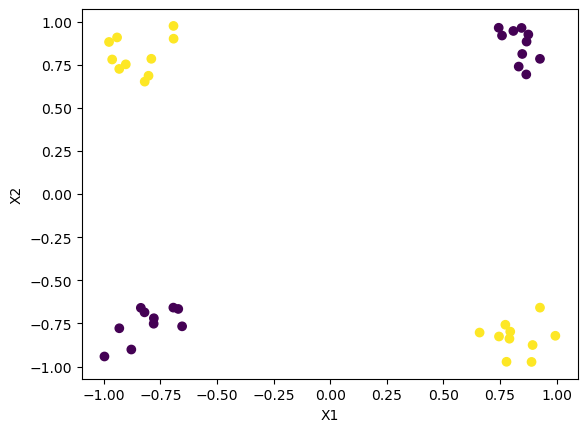

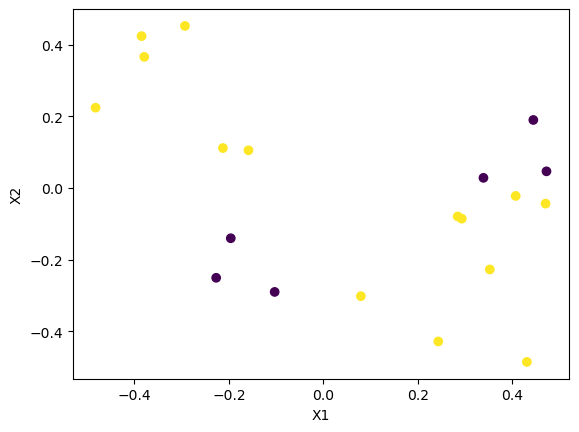

effective_eps  0.32


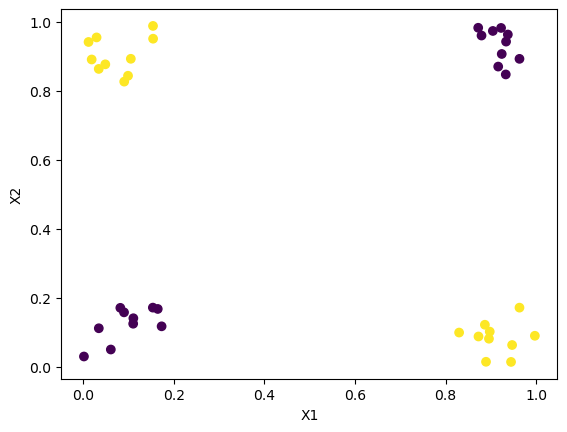

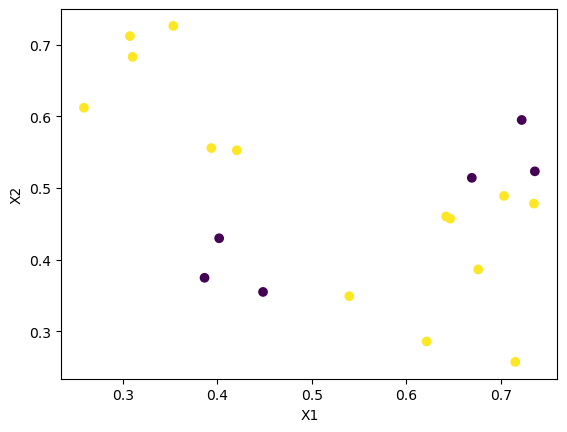

(40, 1, 2) (20, 1, 2)


In [26]:

total_points = 40
points_per_quadrant = total_points//4
test_percent_in_total_points = 0.5
num_test_points = int(test_percent_in_total_points*total_points)
print("num_test_points ",num_test_points)
eps=0.65
# gap_from_axis = math.sqrt(2*eps*eps)+eps/10
gap_from_axis = eps
# Generate points in each quadrant away from axis by gap_from_axis(each quadrant gets same number of points to avoid imbalance issues)
first_quadrant = np.random.uniform(low=gap_from_axis,high=1,size=(points_per_quadrant,2))
second_quadrant = np.transpose(np.stack((np.random.uniform(low=-1,high=-gap_from_axis,size=(points_per_quadrant)),np.random.uniform(low=gap_from_axis,high=1,size=(points_per_quadrant)))),(1,0))
third_quadrant = np.random.uniform(low=-1,high=-gap_from_axis,size=(points_per_quadrant,2))
fourth_quadrant = np.transpose(np.stack((np.random.uniform(low=gap_from_axis,high=1,size=(points_per_quadrant)),np.random.uniform(low=-1,high=-gap_from_axis,size=(points_per_quadrant)))),(1,0))
x_train = np.concatenate((first_quadrant,second_quadrant,third_quadrant,fourth_quadrant))
# Shuffle and allot points to train and test set
np.random.shuffle(x_train)
x_test = np.random.uniform(low=-0.5,high=0.5,size=(num_test_points,2))
y_train = np.bitwise_xor(np.sign(x_train[:,0]).astype(int),np.sign(x_train[:,1]).astype(int))
y_train = np.where(y_train!=0,1,0)
y_test = np.bitwise_xor(np.sign(x_test[:,0]).astype(int),np.sign(x_test[:,1]).astype(int))
y_test = np.where(y_test!=0,1,0)
print(y_test,y_train)
plt.scatter(x_train[:,0],x_train[:,1],c=y_train)
plt.xlabel('X1')
plt.ylabel('X2')
plt.show()

plt.scatter(x_test[:,0],x_test[:,1],c=y_test)
plt.xlabel('X1')
plt.ylabel('X2')
plt.show()
x_train = (x_train - (-1))/(1-(-1))
x_test = (x_test - (-1))/(1-(-1))
effective_eps = round(((gap_from_axis + 1)/2) - 0.5,2)
print("effective_eps ",effective_eps)
plt.scatter(x_train[:,0],x_train[:,1],c=y_train)
plt.xlabel('X1')
plt.ylabel('X2')
plt.show()

plt.scatter(x_test[:,0],x_test[:,1],c=y_test)
plt.xlabel('X1')
plt.ylabel('X2')
plt.show()

x_train = x_train[:,None,:]
x_test = x_test[:,None,:]
print(x_train.shape,x_test.shape)
# with open("./data/custom_datasets/xor_dataset/xor_dataset_40p_0_1r_eps_"+str(eps)+"_post_norm_eps_"+str(round(effective_eps,2))+".npy", 'wb') as file:
#     np.savez(file, X_train=x_train,y_train=y_train,X_test=x_test,y_test=y_test)

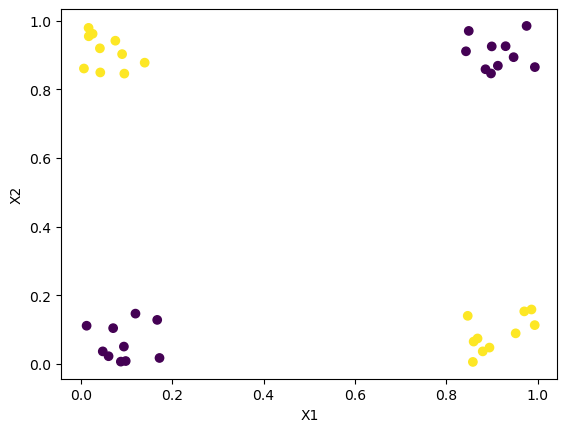

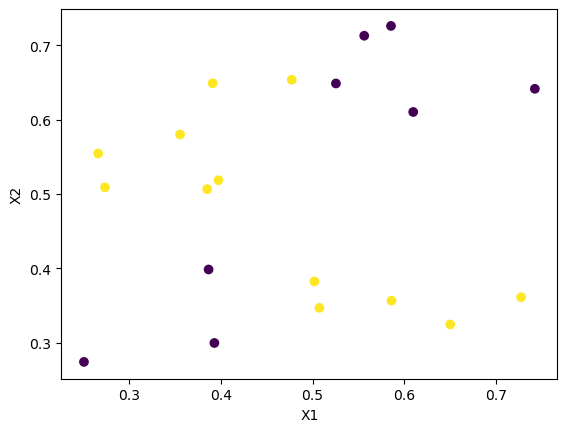

In [58]:
custom_dataset_path = "data/custom_datasets/xor_dataset/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32.npy"
with np.load(custom_dataset_path, allow_pickle=True) as f:
    X_train, y_train = f['X_train'], f['y_train']
    X_test, y_test = f['X_test'], f['y_test']
X_train = X_train[:,0,:]
X_test = X_test[:,0,:]
# for x,y in zip(X_train,y_train):
#     print(x,y,(2*x[0]-1,2*x[1]-1))
plt.scatter(X_train[:,0],X_train[:,1],c=y_train)
plt.xlabel('X1')
plt.ylabel('X2')
plt.savefig("outputs/xor_dataset_train.pdf")
plt.show()

# for x,y in zip(X_test,y_test):
#     print(x,y,(2*x[0]-1,2*x[1]-1))
plt.scatter(X_test[:,0],X_test[:,1],c=y_test)
plt.xlabel('X1')
plt.ylabel('X2')
plt.savefig("outputs/xor_dataset_test.pdf")
plt.show()

In [28]:
def get_NPF_dataset(model,inputs):
    hrelu = HardRelu()
    inputs = torch.from_numpy(inputs).type(torch.float32).to(device)
    with torch.no_grad():
        model(inputs)
        if(not hasattr(model,"value_network")):
            model.linear_conv_outputs.append(model.prev_out)
        for indx in range(len(model.linear_conv_outputs)):
            model.linear_conv_outputs[indx] = hrelu(model.linear_conv_outputs[indx])
        model.linear_conv_outputs.insert(0,torch.flatten(inputs, 1))
        npfs = get_NPFs(model.linear_conv_outputs)
    return npfs

In [29]:
def get_pair_points_to_plot_line(a,b,c):
    if(a != 0):
        y1,y2 = 0.5,-0.5
        x1 = -(b*y1+c)/a
        x2 = -(b*y2+c)/a
        return (x1,y1),(x2,y2)
    if(b != 0):
        x1,x2 = 0.5,-0.5
        y1 = -(a*x1+c)/b
        y2 = -(a*x2+c)/b
        return (x1,y1),(x2,y2)


In [30]:
def get_save_folder(model_path):
    return model_path.replace(".pt","/XOR_ANALYSIS/")

In [31]:
def plot_decision_boundary(model_path,X_train,y_train,X_test,y_test,plot_title=""):
    h = .002  # step size in the mesh
    model_under_analysis = torch.load(model_path)
    model_under_analysis = model_under_analysis.to(device)

    total = X_train.shape[0]
    predicted = model_under_analysis(torch.from_numpy(X_train).type(torch.float32).to(device))
    _,predicted = torch.max(predicted.data, 1)
    print(predicted,y_train)
    correct = (predicted == torch.from_numpy(y_train).to(device)).sum().item()
    print("train_acc ",(correct/total)*100)

    total = X_test.shape[0]
    predicted = model_under_analysis(torch.from_numpy(X_test).type(torch.float32).to(device))
    _,predicted = torch.max(predicted.data, 1)
    correct = (predicted == torch.from_numpy(y_test).to(device)).sum().item()
    print("test_acc ",(correct/total)*100)

    # create a mesh to plot in
    x_min, x_max = 0,1
    y_min, y_max = 0,1
    xx, yy = np.meshgrid(np.arange(x_min, x_max, h),
                        np.arange(y_min, y_max, h))
    dec_inp = torch.from_numpy(np.c_[xx.ravel(), yy.ravel()]).type(torch.float32).to(device)
    Z = model_under_analysis(dec_inp)
    _,Z = torch.max(Z.data, 1)
    Z = Z.cpu().detach().numpy()
    # Put the result into a color plot
    Z = Z.reshape(xx.shape)

    # Plot the decision boundary. For that, we will assign a color to each
    # point in the mesh [x_min, m_max]x[y_min, y_max].
    fig, ax = plt.subplots()
    ax.contourf(xx, yy, Z, cmap=plt.cm.Paired)
    # ax.axis('off')

    # Plot also the training points
    ax.scatter(X_test[:, 0], X_test[:, 1], c=y_test, cmap=plt.cm.Paired)
    ax.grid(color = 'green', linestyle = '--', linewidth = 0.5,axis = 'y')
    ax.grid(color = 'red', linestyle = '--', linewidth = 0.5,axis = 'x')
    ax.set_xticks(np.arange(0, 1, 0.1))
    ax.set_yticks(np.arange(0, 1, 0.1))

    ax.set_title(plot_title)
    save_folder = get_save_folder(model_path)+"/"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)
    plt.savefig(save_folder+"/decision_boundary.jpg")
    plt.savefig(save_folder+"/decision_boundary.pdf")

In [73]:
def plot_hyperplanes(model_path,X_train,y_train,X_test,y_test,plot_title=""):
    model_under_analysis = torch.load(model_path)
    model_under_analysis = model_under_analysis.to(device)
    model_under_analysis.eval()
    dummy_input = torch.rand([1,2]).unsqueeze(0)
    dummy_input = dummy_input.to(device)
    print("dummy_input ",dummy_input.size())
    conv_matrix_operations_in_each_layer, conv_bias_operations_in_each_layer, channel_outs_size_in_each_layer = model_under_analysis.exact_forward_vis(dummy_input)

    save_folder = get_save_folder(model_path)+"/"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)

    fig, ax = plt.subplots(len(conv_matrix_operations_in_each_layer),1,figsize=(25,100))
    indx = 0
    colors = ['b','brown','g','y']
    with torch.no_grad():
        for key,cur_m in model_under_analysis.get_gate_layers_ordered_dict().items():
            cur_weight = conv_matrix_operations_in_each_layer[key].cpu().numpy()
            cur_bias = conv_bias_operations_in_each_layer[key].cpu().numpy()

            fig1, ax1 = plt.subplots(1,1,figsize=(25,25))
            for each_h_indx in range(cur_weight.shape[0]):
                a,b,c = cur_weight[each_h_indx][0],cur_weight[each_h_indx][1],cur_bias[each_h_indx]
                (x1, y1), (x2, y2) = get_pair_points_to_plot_line(a,b,c)
                ax[indx].axline((x1, y1), (x2, y2),label="HP_indx:{}".format(each_h_indx),c=colors[each_h_indx%4])
                ax1.axline((x1, y1), (x2, y2),label="HP_indx:{}".format(each_h_indx),c=colors[each_h_indx%4])
            # Plot also the testing points
            tmp_X_test = X_test
            ax[indx].scatter(tmp_X_test[:, 0], tmp_X_test[:, 1], c=y_test, cmap=plt.cm.Paired)
            ax[indx].scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=plt.cm.Paired)
            ax[indx].grid(color = 'green', linestyle = '--', linewidth = 0.5,axis = 'y')
            ax[indx].grid(color = 'red', linestyle = '--', linewidth = 0.5,axis = 'x')
            ax[indx].set_xticks(np.arange(0, 1, 0.1))
            ax[indx].set_yticks(np.arange(0, 1, 0.1))
            
            ax[indx].set_title("Hyperplanes of gates for {} at layer:{}".format(plot_title,indx+1),fontsize=45)
            ax[indx].legend()

            ax1.scatter(tmp_X_test[:, 0], tmp_X_test[:, 1], c=y_test, cmap=plt.cm.Paired)
            ax1.scatter(X_train[:, 0], X_train[:, 1], c=y_train, cmap=plt.cm.Paired)
            ax1.grid(color = 'green', linestyle = '--', linewidth = 0.5,axis = 'y')
            ax1.grid(color = 'red', linestyle = '--', linewidth = 0.5,axis = 'x')
            ax1.set_xticks(np.arange(0, 1, 0.1))
            ax1.set_yticks(np.arange(0, 1, 0.1))
            
            ax1.set_title("Hyperplanes of gates for {} at layer:{}".format(plot_title,indx+1),fontsize=45)
            ax1.legend()
            plt.savefig(save_folder+"/hyperplane_plots_L_{}.jpg".format(indx+1))
            plt.savefig(save_folder+"/hyperplane_plots_L_{}.pdf".format(indx+1))

            indx+=1

    
    plt.savefig(save_folder+"/hyperplane_plots.jpg")
    plt.savefig(save_folder+"/hyperplane_plots.pdf")

In [33]:
X_test.shape,X_train.shape

((20, 2), (40, 2))

tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1,
        1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0') [1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1
 1 1 0]
train_acc  100.0
test_acc  95.0


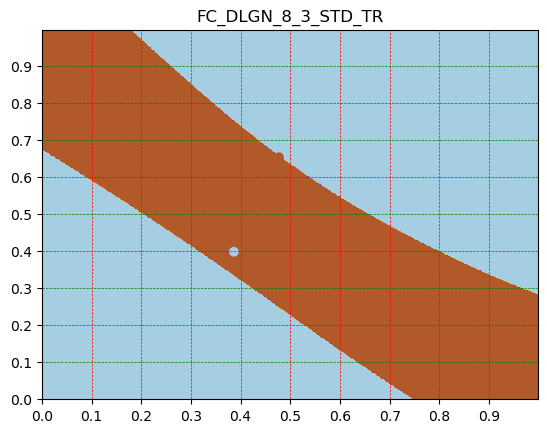

In [34]:
plot_decision_boundary("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/CLEAN_TRAINING/ST_2022/fc_dlgn_W_8_D_3_dir.pt",X_train,y_train,X_test,y_test,plot_title="FC_DLGN_8_3_STD_TR")

In [59]:
cnpfs = get_NPF_dataset(torch.load("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/CLEAN_TRAINING/ST_2022/fc_dlgn_W_4_D_3_dir.pt"),X_train).T
cnpfs.shape

torch.Size([40, 128])

In [ ]:
[c for c in cnpfs]

In [ ]:
c1_indx = y_train == 0
c2_indx = y_train == 1
c1_npf = cnpfs[c1_indx].cpu().numpy()
c2_npf = cnpfs[c2_indx].cpu().numpy()
# c1_npf = [c for c in c1_npf]
# c2_npf = [c for c in c2_npf]
c1_npf,c2_npf

In [68]:
def plot_class_wise_npfs(model_path,X_train,y_train,plot_title,classes=[0,1]):
    model_under_analysis = torch.load(model_path)
    model_under_analysis = model_under_analysis.to(device)
    model_under_analysis.eval()
    cnpfs = get_NPF_dataset(model_under_analysis,X_train).T
    fig, ax = plt.subplots(len(classes),1,figsize=(100,100),sharey=True)
    # labels = []
    # def add_label(violin, label):
    #     color = violin["bodies"][0].get_facecolor().flatten()
    #     labels.append((mpatches.Patch(color=color), label))

    for i,cur_class_indx in enumerate(classes):
        curclass_indx = y_train == 0
        curclass_npf = (cnpfs[curclass_indx]).T.cpu().numpy()
        curclass_npf = [c for c in curclass_npf]
        cax = ax[i]
        # add_label(ax.violinplot(curclass_npf,showmedians=True), "Class:{}".format(cur_class_indx))
        cax.violinplot(curclass_npf,showmedians=True)
        cax.grid(color = 'green', linestyle = '--', linewidth = 0.5,axis = 'y')
        cax.grid(color = 'red', linestyle = '--', linewidth = 0.5,axis = 'x')
        cax.set_xticks(np.arange(0, 128, 1))
        cax.set_title("NPFs of {} for class:{}".format(plot_title,cur_class_indx),fontsize=45)
    # plt.legend(*zip(*labels), loc=2)
    save_folder = get_save_folder(model_path)+"/"
    if not os.path.exists(save_folder):
        os.makedirs(save_folder)
    plt.savefig(save_folder+"/class_wise_npf.jpg")
    plt.savefig(save_folder+"/class_wise_npf.pdf")


In [70]:
plot_class_wise_npfs("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/CLEAN_TRAINING/ST_2022/fc_dlgn_W_4_D_3_dir.pt",X_train,y_train,plot_title="FC_DLGN_4_3_STD_TR")

tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1,
        1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0') [1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1
 1 1 0]
train_acc  100.0
test_acc  80.0


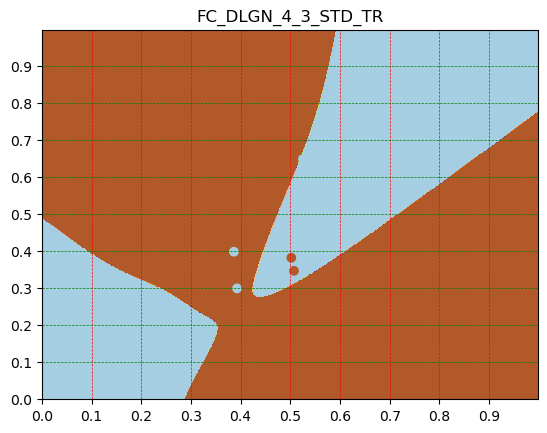

In [21]:
plot_decision_boundary("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/CLEAN_TRAINING/ST_2022/fc_dlgn_W_4_D_3_dir.pt",X_train,y_train,X_test,y_test,plot_title="FC_DLGN_4_3_STD_TR")

dummy_input  torch.Size([1, 1, 2])
current_tensor_size  torch.Size([1, 2])
current_layer Linear(in_features=2, out_features=4, bias=True)
merged_conv_matrix:torch.Size([4, 2]) merged_conv_bias:torch.Size([4]) current_tensor_size:(4,)
difference_in_output  tensor(0., device='cuda:0')
current_layer Linear(in_features=4, out_features=4, bias=True)
merged_conv_matrix:torch.Size([4, 2]) merged_conv_bias:torch.Size([4]) current_tensor_size:(4,)
difference_in_output  tensor(5.9605e-07, device='cuda:0')
current_layer Linear(in_features=4, out_features=4, bias=True)
merged_conv_matrix:torch.Size([4, 2]) merged_conv_bias:torch.Size([4]) current_tensor_size:(4,)
difference_in_output  tensor(4.7684e-07, device='cuda:0')


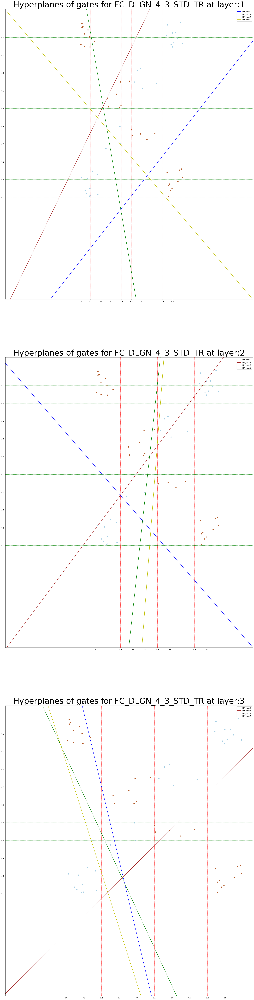

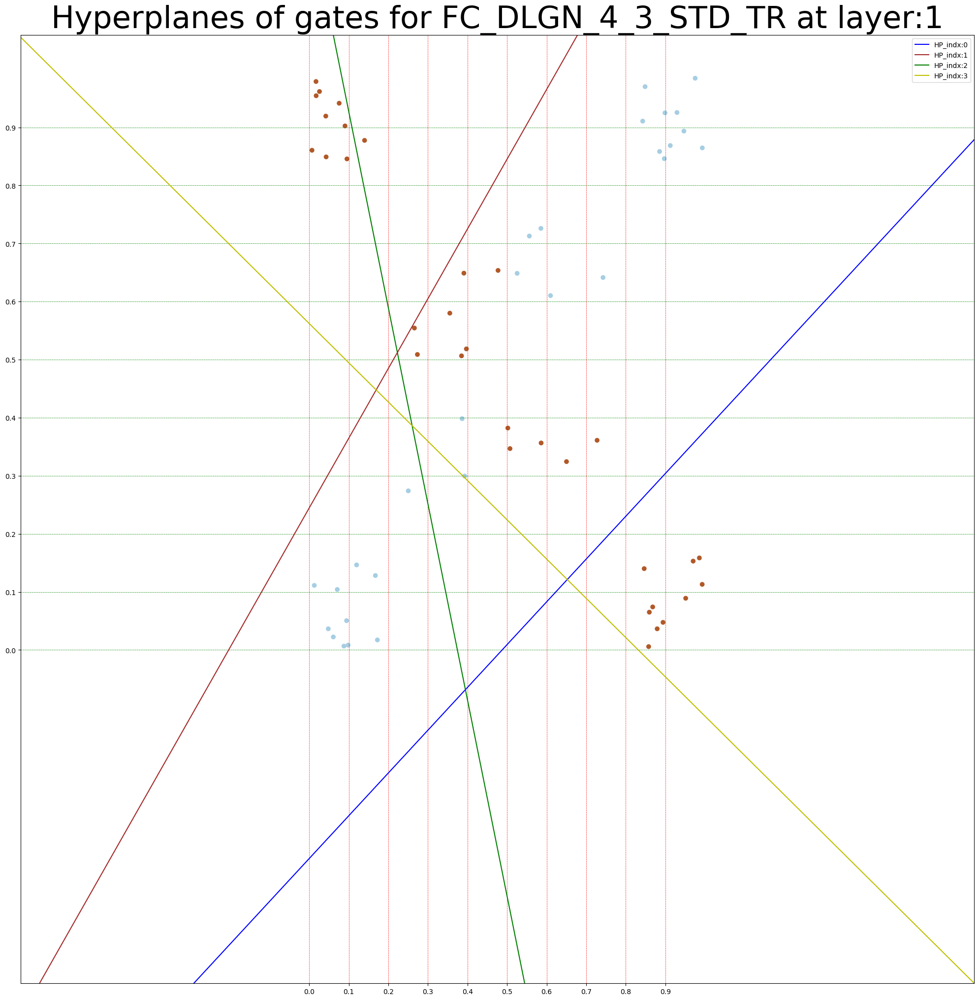

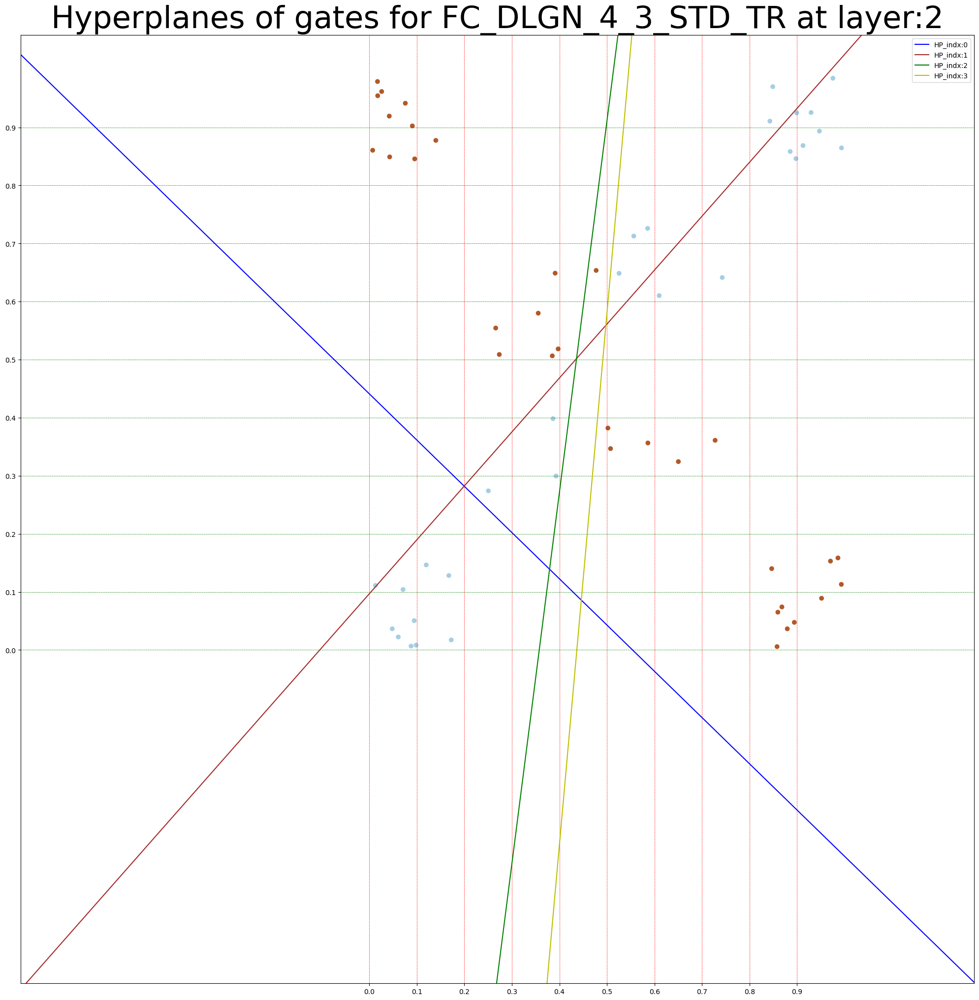

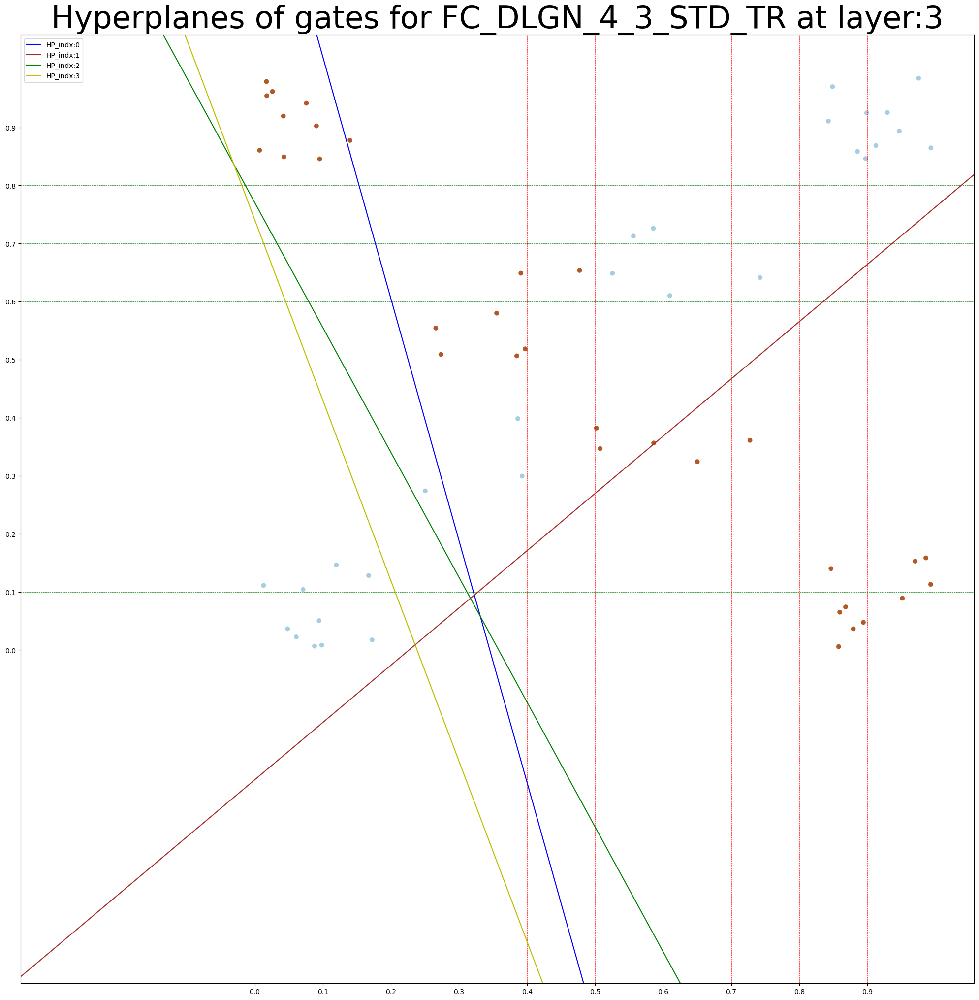

In [74]:
plot_hyperplanes("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/CLEAN_TRAINING/ST_2022/fc_dlgn_W_4_D_3_dir.pt",X_train,y_train,X_test,y_test,plot_title="FC_DLGN_4_3_STD_TR")

tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1,
        1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0') [1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1
 1 1 0]
train_acc  100.0
test_acc  75.0


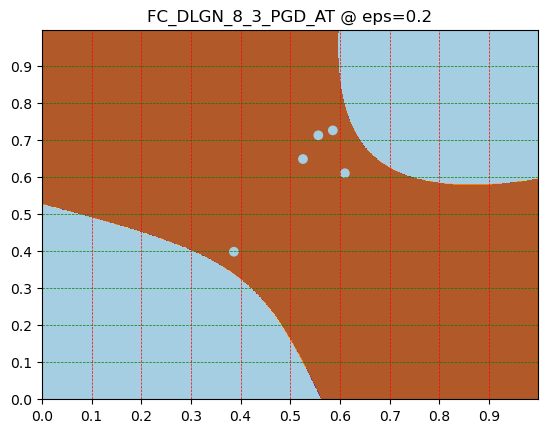

In [64]:
plot_decision_boundary("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/adversarial_training/MT_fc_dlgn_W_8_D_3_ET_ADV_TRAINING/ST_2022/fast_adv_attack_type_PGD/adv_type_PGD/EPS_0.2/OPT_Adam (Parameter Group 0    amsgrad: False    betas: (0.9, 0.999)    eps: 1e-08    lr: 0.01    weight_decay: 0)/batch_size_64/eps_stp_size_0.005/adv_steps_40/update_on_all/R_init_True/norm_inf/use_ytrue_True/out_lossfn_CrossEntropyLoss()/inner_lossfn_CrossEntropyLoss()/adv_model_dir.pt",X_train,y_train,X_test,y_test,plot_title="FC_DLGN_8_3_PGD_AT @ eps=0.2")

tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1,
        1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0') [1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1
 1 1 0]
train_acc  100.0
test_acc  100.0


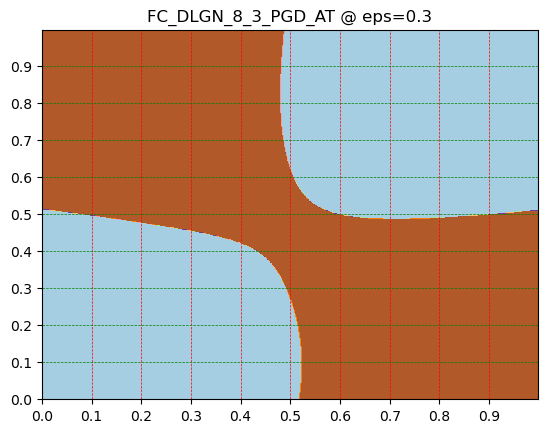

In [23]:
plot_decision_boundary("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/adversarial_training/MT_fc_dlgn_W_8_D_3_ET_ADV_TRAINING/ST_2022/fast_adv_attack_type_PGD/adv_type_PGD/EPS_0.3/OPT_Adam (Parameter Group 0    amsgrad: False    betas: (0.9, 0.999)    eps: 1e-08    lr: 0.01    weight_decay: 0)/batch_size_64/eps_stp_size_0.01/adv_steps_40/update_on_all/R_init_True/norm_inf/use_ytrue_True/out_lossfn_CrossEntropyLoss()/inner_lossfn_CrossEntropyLoss()/adv_model_dir.pt",X_train,y_train,X_test,y_test,plot_title="FC_DLGN_8_3_PGD_AT @ eps=0.3")

tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1,
        1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0') [1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1
 1 1 0]
train_acc  100.0
test_acc  95.0


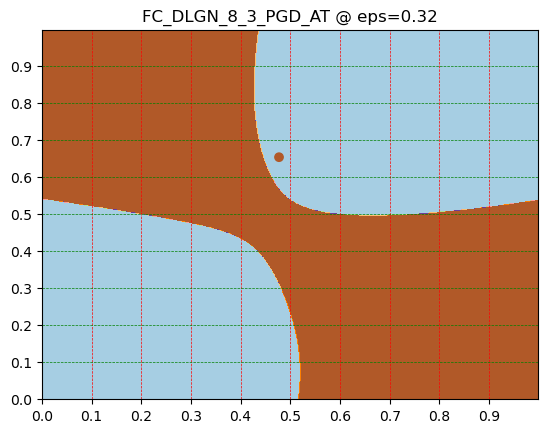

In [65]:
plot_decision_boundary("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/adversarial_training/MT_fc_dlgn_W_8_D_3_ET_ADV_TRAINING/ST_2022/fast_adv_attack_type_PGD/adv_type_PGD/EPS_0.32/OPT_Adam (Parameter Group 0    amsgrad: False    betas: (0.9, 0.999)    eps: 1e-08    lr: 0.01    weight_decay: 0)/batch_size_64/eps_stp_size_0.01/adv_steps_40/update_on_all/R_init_True/norm_inf/use_ytrue_True/out_lossfn_CrossEntropyLoss()/inner_lossfn_CrossEntropyLoss()/adv_model_dir.pt",X_train,y_train,X_test,y_test,plot_title="FC_DLGN_8_3_PGD_AT @ eps=0.32")

tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1,
        1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0') [1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1
 1 1 0]
train_acc  100.0
test_acc  60.0


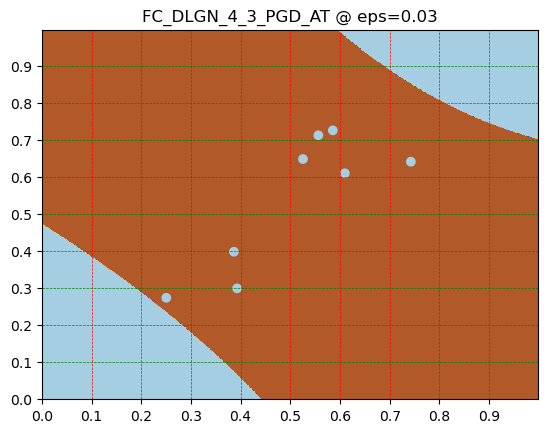

In [76]:
plot_decision_boundary("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/adversarial_training/MT_fc_dlgn_W_4_D_3_ET_ADV_TRAINING/ST_2022/fast_adv_attack_type_PGD/adv_type_PGD/EPS_0.03/OPT_Adam (Parameter Group 0    amsgrad: False    betas: (0.9, 0.999)    eps: 1e-08    lr: 0.03    weight_decay: 0)/batch_size_64/eps_stp_size_0.005/adv_steps_40/update_on_all/R_init_True/norm_inf/use_ytrue_True/out_lossfn_CrossEntropyLoss()/inner_lossfn_CrossEntropyLoss()/adv_model_dir.pt",X_train,y_train,X_test,y_test,plot_title="FC_DLGN_4_3_PGD_AT @ eps=0.03")

tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1,
        1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0') [1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1
 1 1 0]
train_acc  100.0
test_acc  65.0


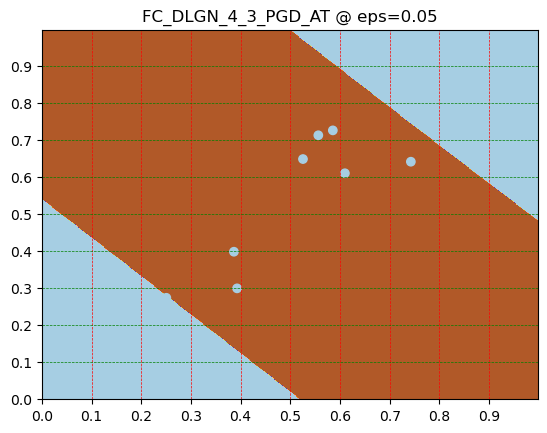

In [73]:
plot_decision_boundary("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/adversarial_training/MT_fc_dlgn_W_4_D_3_ET_ADV_TRAINING/ST_2022/fast_adv_attack_type_PGD/adv_type_PGD/EPS_0.05/OPT_Adam (Parameter Group 0    amsgrad: False    betas: (0.9, 0.999)    eps: 1e-08    lr: 0.03    weight_decay: 0)/batch_size_64/eps_stp_size_0.005/adv_steps_40/update_on_all/R_init_True/norm_inf/use_ytrue_True/out_lossfn_CrossEntropyLoss()/inner_lossfn_CrossEntropyLoss()/adv_model_dir.pt",X_train,y_train,X_test,y_test,plot_title="FC_DLGN_4_3_PGD_AT @ eps=0.05")

tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1,
        1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0') [1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1
 1 1 0]
train_acc  100.0
test_acc  75.0


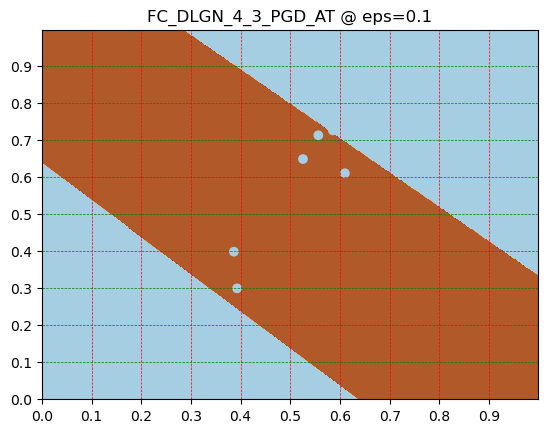

In [72]:
plot_decision_boundary("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/adversarial_training/MT_fc_dlgn_W_4_D_3_ET_ADV_TRAINING/ST_2022/fast_adv_attack_type_PGD/adv_type_PGD/EPS_0.1/OPT_Adam (Parameter Group 0    amsgrad: False    betas: (0.9, 0.999)    eps: 1e-08    lr: 0.03    weight_decay: 0)/batch_size_64/eps_stp_size_0.005/adv_steps_40/update_on_all/R_init_True/norm_inf/use_ytrue_True/out_lossfn_CrossEntropyLoss()/inner_lossfn_CrossEntropyLoss()/adv_model_dir.pt",X_train,y_train,X_test,y_test,plot_title="FC_DLGN_4_3_PGD_AT @ eps=0.1")

tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1,
        1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0') [1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1
 1 1 0]
train_acc  100.0
test_acc  90.0


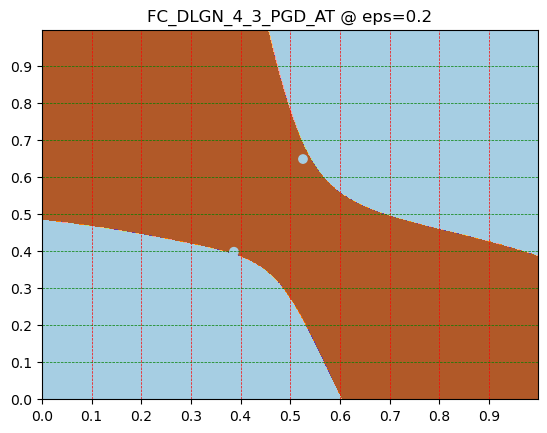

In [30]:
plot_decision_boundary("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/adversarial_training/MT_fc_dlgn_W_4_D_3_ET_ADV_TRAINING/ST_2022/fast_adv_attack_type_PGD/adv_type_PGD/EPS_0.2/OPT_Adam (Parameter Group 0    amsgrad: False    betas: (0.9, 0.999)    eps: 1e-08    lr: 0.01    weight_decay: 0)/batch_size_64/eps_stp_size_0.005/adv_steps_40/update_on_all/R_init_True/norm_inf/use_ytrue_True/out_lossfn_CrossEntropyLoss()/inner_lossfn_CrossEntropyLoss()/adv_model_dir.pt",X_train,y_train,X_test,y_test,plot_title="FC_DLGN_4_3_PGD_AT @ eps=0.2")

In [43]:
plot_class_wise_npfs("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/adversarial_training/MT_fc_dlgn_W_4_D_3_ET_ADV_TRAINING/ST_2022/fast_adv_attack_type_PGD/adv_type_PGD/EPS_0.2/OPT_Adam (Parameter Group 0    amsgrad: False    betas: (0.9, 0.999)    eps: 1e-08    lr: 0.01    weight_decay: 0)/batch_size_64/eps_stp_size_0.005/adv_steps_40/update_on_all/R_init_True/norm_inf/use_ytrue_True/out_lossfn_CrossEntropyLoss()/inner_lossfn_CrossEntropyLoss()/adv_model_dir.pt",X_train,plot_title="FC_DLGN_4_3_PGD_AT @ eps=0.2")

dummy_input  torch.Size([1, 1, 2])
current_tensor_size  torch.Size([1, 2])
current_layer Linear(in_features=2, out_features=4, bias=True)
merged_conv_matrix:torch.Size([4, 2]) merged_conv_bias:torch.Size([4]) current_tensor_size:(4,)
difference_in_output  tensor(0., device='cuda:0')
current_layer Linear(in_features=4, out_features=4, bias=True)
merged_conv_matrix:torch.Size([4, 2]) merged_conv_bias:torch.Size([4]) current_tensor_size:(4,)
difference_in_output  tensor(2.3842e-07, device='cuda:0')
current_layer Linear(in_features=4, out_features=4, bias=True)
merged_conv_matrix:torch.Size([4, 2]) merged_conv_bias:torch.Size([4]) current_tensor_size:(4,)
difference_in_output  tensor(8.3447e-07, device='cuda:0')


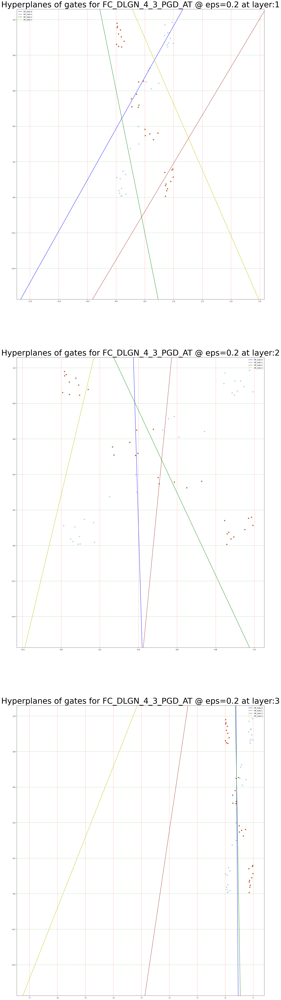

In [34]:
plot_hyperplanes("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/adversarial_training/MT_fc_dlgn_W_4_D_3_ET_ADV_TRAINING/ST_2022/fast_adv_attack_type_PGD/adv_type_PGD/EPS_0.2/OPT_Adam (Parameter Group 0    amsgrad: False    betas: (0.9, 0.999)    eps: 1e-08    lr: 0.01    weight_decay: 0)/batch_size_64/eps_stp_size_0.005/adv_steps_40/update_on_all/R_init_True/norm_inf/use_ytrue_True/out_lossfn_CrossEntropyLoss()/inner_lossfn_CrossEntropyLoss()/adv_model_dir.pt",X_train,y_train,X_test,y_test,plot_title="FC_DLGN_4_3_PGD_AT @ eps=0.2")

tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1,
        1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0') [1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1
 1 1 0]
train_acc  100.0
test_acc  85.0


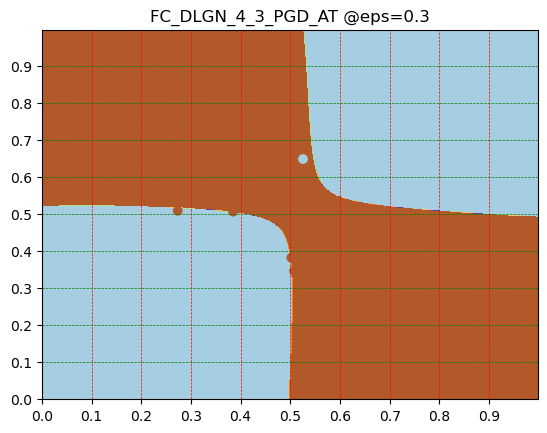

In [29]:
plot_decision_boundary("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/adversarial_training/MT_fc_dlgn_W_4_D_3_ET_ADV_TRAINING/ST_2022/fast_adv_attack_type_PGD/adv_type_PGD/EPS_0.3/OPT_Adam (Parameter Group 0    amsgrad: False    betas: (0.9, 0.999)    eps: 1e-08    lr: 0.01    weight_decay: 0)/batch_size_64/eps_stp_size_0.01/adv_steps_40/update_on_all/R_init_True/norm_inf/use_ytrue_True/out_lossfn_CrossEntropyLoss()/inner_lossfn_CrossEntropyLoss()/adv_model_dir.pt",X_train,y_train,X_test,y_test,plot_title="FC_DLGN_4_3_PGD_AT @eps=0.3")

In [44]:
plot_class_wise_npfs("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/adversarial_training/MT_fc_dlgn_W_4_D_3_ET_ADV_TRAINING/ST_2022/fast_adv_attack_type_PGD/adv_type_PGD/EPS_0.3/OPT_Adam (Parameter Group 0    amsgrad: False    betas: (0.9, 0.999)    eps: 1e-08    lr: 0.01    weight_decay: 0)/batch_size_64/eps_stp_size_0.01/adv_steps_40/update_on_all/R_init_True/norm_inf/use_ytrue_True/out_lossfn_CrossEntropyLoss()/inner_lossfn_CrossEntropyLoss()/adv_model_dir.pt",X_train,plot_title="FC_DLGN_4_3_PGD_AT @ eps=0.3")

dummy_input  torch.Size([1, 1, 2])
current_tensor_size  torch.Size([1, 2])
current_layer Linear(in_features=2, out_features=4, bias=True)
merged_conv_matrix:torch.Size([4, 2]) merged_conv_bias:torch.Size([4]) current_tensor_size:(4,)
difference_in_output  tensor(0., device='cuda:0')
current_layer Linear(in_features=4, out_features=4, bias=True)
merged_conv_matrix:torch.Size([4, 2]) merged_conv_bias:torch.Size([4]) current_tensor_size:(4,)
difference_in_output  tensor(5.9605e-08, device='cuda:0')
current_layer Linear(in_features=4, out_features=4, bias=True)
merged_conv_matrix:torch.Size([4, 2]) merged_conv_bias:torch.Size([4]) current_tensor_size:(4,)
difference_in_output  tensor(1.4901e-08, device='cuda:0')


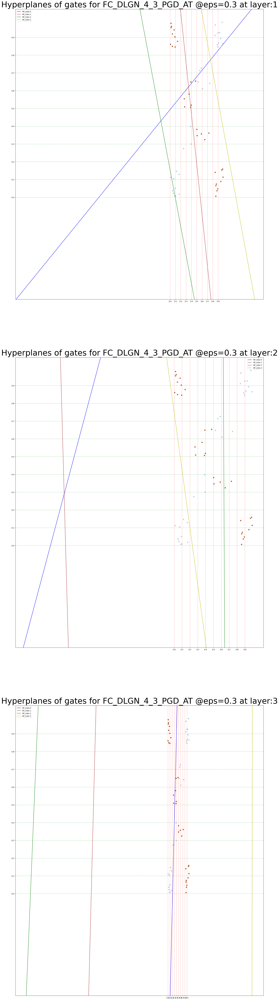

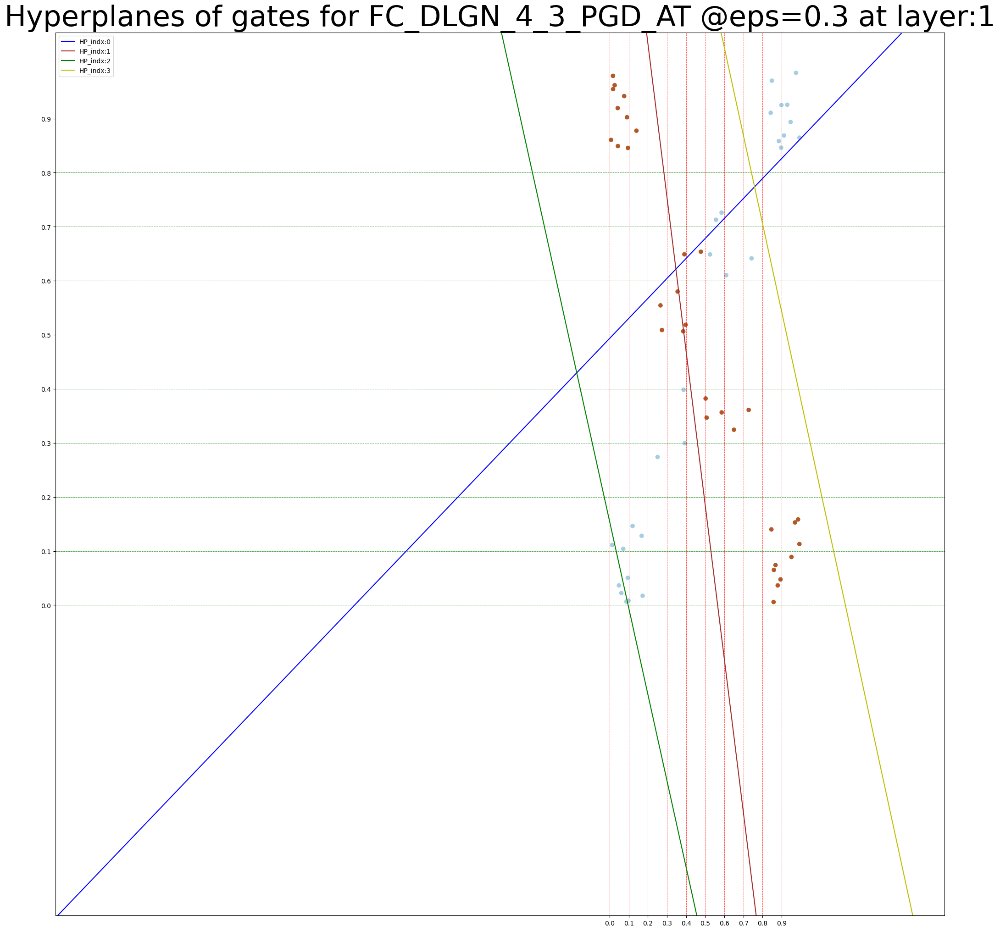

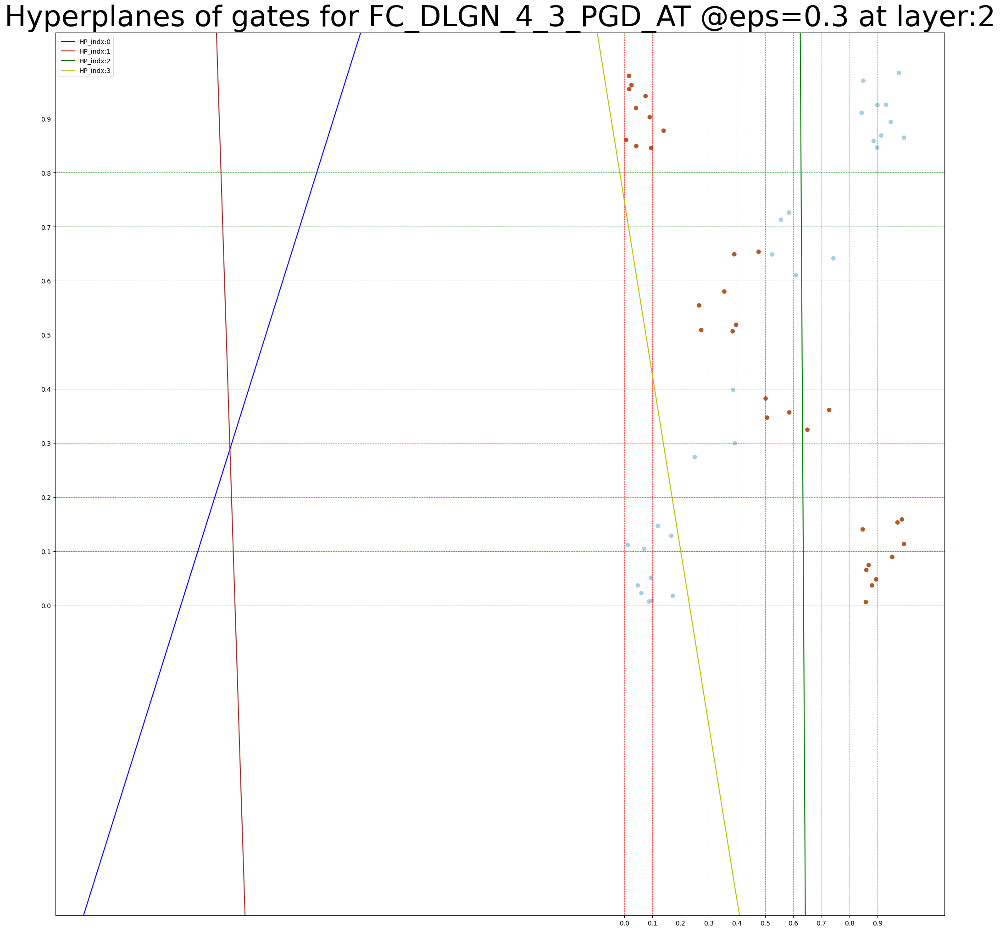

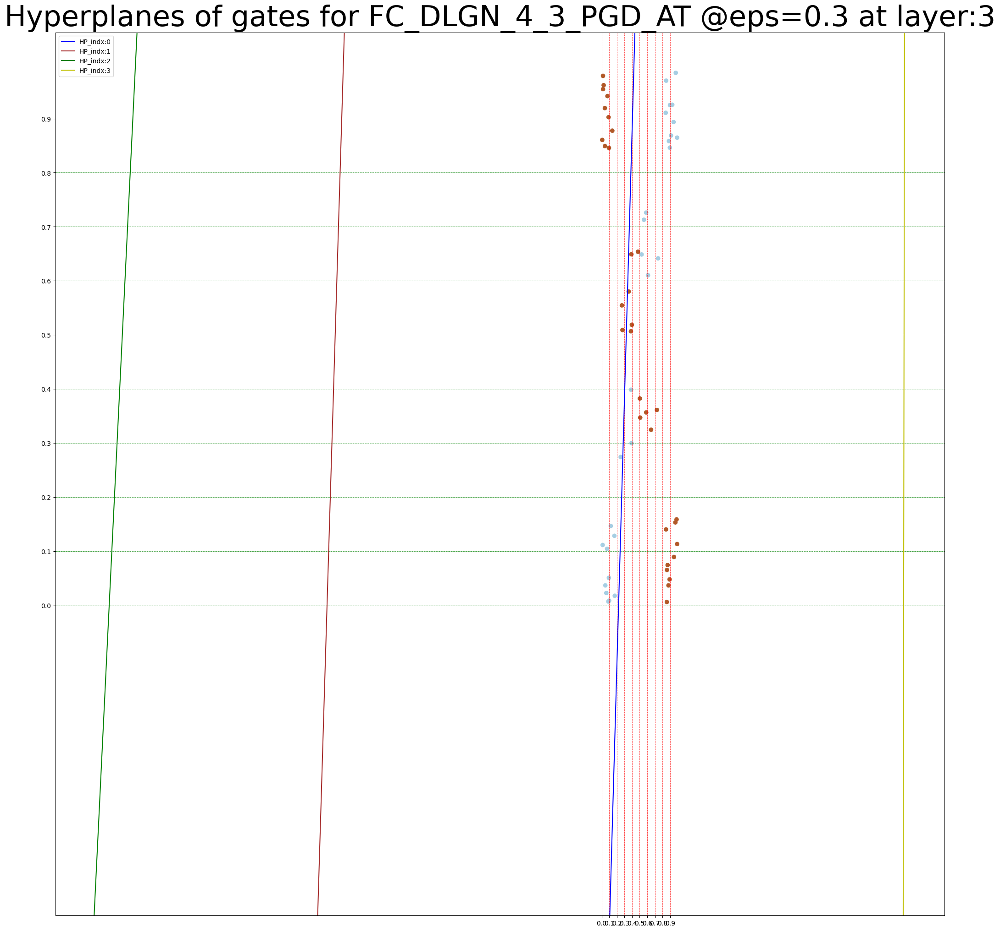

In [75]:
plot_hyperplanes("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/adversarial_training/MT_fc_dlgn_W_4_D_3_ET_ADV_TRAINING/ST_2022/fast_adv_attack_type_PGD/adv_type_PGD/EPS_0.3/OPT_Adam (Parameter Group 0    amsgrad: False    betas: (0.9, 0.999)    eps: 1e-08    lr: 0.01    weight_decay: 0)/batch_size_64/eps_stp_size_0.01/adv_steps_40/update_on_all/R_init_True/norm_inf/use_ytrue_True/out_lossfn_CrossEntropyLoss()/inner_lossfn_CrossEntropyLoss()/adv_model_dir.pt",X_train,y_train,X_test,y_test,plot_title="FC_DLGN_4_3_PGD_AT @eps=0.3")

tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1,
        1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0') [1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1
 1 1 0]
train_acc  100.0
test_acc  90.0


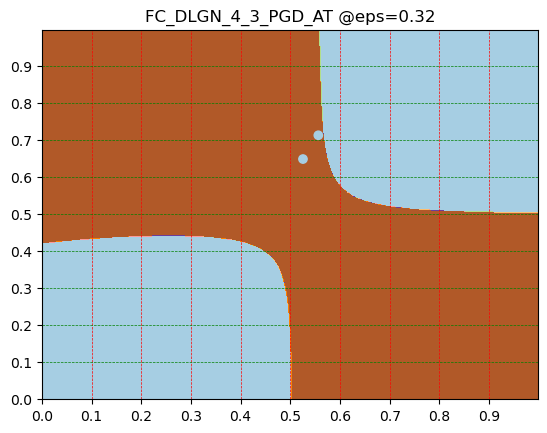

In [63]:
plot_decision_boundary("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/adversarial_training/MT_fc_dlgn_W_4_D_3_ET_ADV_TRAINING/ST_2022/fast_adv_attack_type_PGD/adv_type_PGD/EPS_0.32/OPT_Adam (Parameter Group 0    amsgrad: False    betas: (0.9, 0.999)    eps: 1e-08    lr: 0.01    weight_decay: 0)/batch_size_64/eps_stp_size_0.01/adv_steps_40/update_on_all/R_init_True/norm_inf/use_ytrue_True/out_lossfn_CrossEntropyLoss()/inner_lossfn_CrossEntropyLoss()/adv_model_dir.pt",X_train,y_train,X_test,y_test,plot_title="FC_DLGN_4_3_PGD_AT @eps=0.32")

tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1,
        1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0') [1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1
 1 1 0]
train_acc  100.0
test_acc  80.0


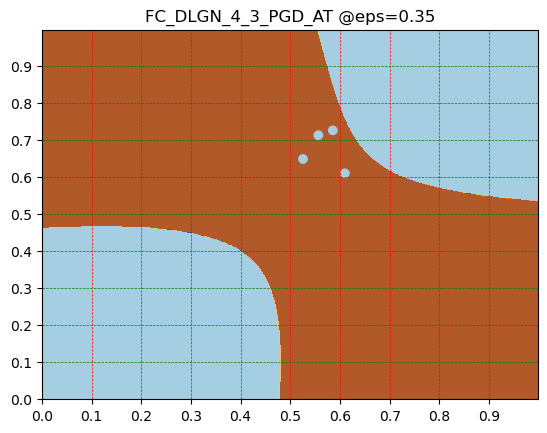

In [67]:
plot_decision_boundary("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/adversarial_training/MT_fc_dlgn_W_4_D_3_ET_ADV_TRAINING/ST_2022/fast_adv_attack_type_PGD/adv_type_PGD/EPS_0.35/OPT_Adam (Parameter Group 0    amsgrad: False    betas: (0.9, 0.999)    eps: 1e-08    lr: 0.01    weight_decay: 0)/batch_size_64/eps_stp_size_0.01/adv_steps_40/update_on_all/R_init_True/norm_inf/use_ytrue_True/out_lossfn_CrossEntropyLoss()/inner_lossfn_CrossEntropyLoss()/adv_model_dir.pt",X_train,y_train,X_test,y_test,plot_title="FC_DLGN_4_3_PGD_AT @eps=0.35")

tensor([1, 0, 1, 0, 0, 0, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 1,
        1, 0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 0], device='cuda:0') [1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1
 1 1 0]
train_acc  100.0
test_acc  70.0


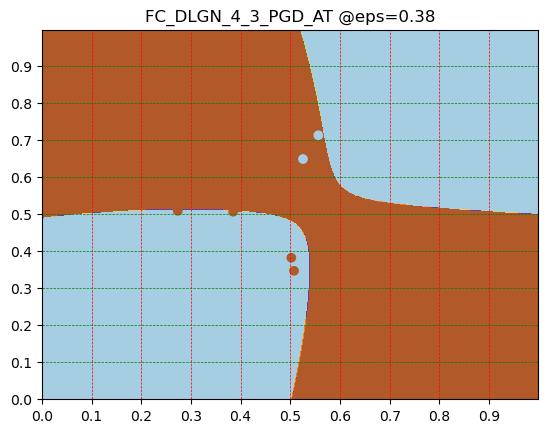

In [71]:
plot_decision_boundary("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/adversarial_training/MT_fc_dlgn_W_4_D_3_ET_ADV_TRAINING/ST_2022/fast_adv_attack_type_PGD/adv_type_PGD/EPS_0.38/OPT_Adam (Parameter Group 0    amsgrad: False    betas: (0.9, 0.999)    eps: 1e-08    lr: 0.01    weight_decay: 0)/batch_size_64/eps_stp_size_0.01/adv_steps_40/update_on_all/R_init_True/norm_inf/use_ytrue_True/out_lossfn_CrossEntropyLoss()/inner_lossfn_CrossEntropyLoss()/adv_model_dir.pt",X_train,y_train,X_test,y_test,plot_title="FC_DLGN_4_3_PGD_AT @eps=0.38")

tensor([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
        1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1], device='cuda:0') [1 0 1 0 0 0 1 1 0 1 0 0 1 0 1 0 1 0 0 1 1 1 0 1 1 0 0 1 0 0 0 1 0 1 0 1 1
 1 1 0]
train_acc  50.0
test_acc  60.0


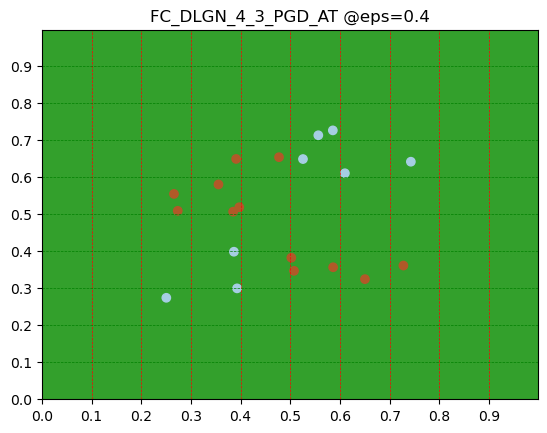

In [68]:
plot_decision_boundary("root/model/save/xor_dataset_40p_0_1r_eps_0.65_post_norm_eps_0.32/adversarial_training/MT_fc_dlgn_W_4_D_3_ET_ADV_TRAINING/ST_2022/fast_adv_attack_type_PGD/adv_type_PGD/EPS_0.4/OPT_Adam (Parameter Group 0    amsgrad: False    betas: (0.9, 0.999)    eps: 1e-08    lr: 0.01    weight_decay: 0)/batch_size_64/eps_stp_size_0.01/adv_steps_40/update_on_all/R_init_True/norm_inf/use_ytrue_True/out_lossfn_CrossEntropyLoss()/inner_lossfn_CrossEntropyLoss()/adv_model_dir.pt",X_train,y_train,X_test,y_test,plot_title="FC_DLGN_4_3_PGD_AT @eps=0.4")

In [8]:
# !pip install transformers
# !pip install 'transformers[flax]'
!pip install git+https://github.com/huggingface/transformers

  Cloning https://github.com/huggingface/transformers to /tmp/pip-req-build-7phiv3je
  Running command git clone -q https://github.com/huggingface/transformers /tmp/pip-req-build-7phiv3je
  Resolved https://github.com/huggingface/transformers to commit 1082361a1978d30db5c3932d1ee08914d74d9697
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
    Preparing wheel metadata ... done
  Using cached tokenizers-0.19.1-cp37-cp37m-manylinux_2_17_x86_64.manylinux2014_x86_64.whl (3.6 MB)
ERROR: Could not find a version that satisfies the requirement huggingface-hub<1.0,>=0.23.2 (from transformers) (from versions: 0.0.1, 0.0.2, 0.0.3rc1, 0.0.3rc2, 0.0.5, 0.0.6, 0.0.7, 0.0.8, 0.0.9, 0.0.10, 0.0.11, 0.0.12, 0.0.13, 0.0.14, 0.0.15, 0.0.16, 0.0.17, 0.0.18, 0.0.19, 0.1.0, 0.1.1, 0.1.2, 0.2.0, 0.2.1, 0.4.0, 0.5.0, 0.5.1, 0.6.0rc0, 0.6.0, 0.7.0rc0, 0.7.0, 0.8.0rc0, 0.8.0rc1, 0.8.0rc2, 0.8.0rc3, 0.8.0rc4, 0.8.0, 0.8.1, 0.9.0.dev0, 0.9.0rc0, 0.9.0rc2, 0.9.0rc3, 0.9.0, 

In [15]:
from transformers import GPT2Tokenizer
tokenizer = GPT2Tokenizer.from_pretrained("gpt2",add_prefix_space=False)

In [14]:
print(tokenizer.tokenize("Hello world"))
print(tokenizer.tokenize("This is lion from bengaluru."))

['ĠHello', 'Ġworld']
['ĠThis', 'Ġis', 'Ġlion', 'Ġfrom', 'Ġb', 'eng', 'al', 'uru', '.']


In [16]:
print(tokenizer.tokenize("Hello world"))
print(tokenizer.tokenize("This is lion from bengaluru."))

['Hello', 'Ġworld']
['This', 'Ġis', 'Ġlion', 'Ġfrom', 'Ġb', 'eng', 'al', 'uru', '.']


In [17]:
from transformers import AutoTokenizer

tokenizerbert = AutoTokenizer.from_pretrained("bert-base-uncased")

In [18]:
print(tokenizerbert.tokenize("Hello world"))
print(tokenizerbert.tokenize("This is lion from bengaluru."))

['hello', 'world']
['this', 'is', 'lion', 'from', 'bengal', '##uru', '.']
